# Importing and Installing Necessary Libraries

In [ ]:
from scipy.io import arff
import pandas as pd
import numpy as np
from numpy import mean
from numpy import std
from numpy import dstack
from pandas import read_csv
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.utils import to_categorical

In [ ]:
!pip install lime

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Reading Data

In [ ]:
X=pd.read_csv('/content/drive/My Drive/darknet_dataset_processed.csv')
onehotlabels=pd.read_csv('/content/drive/My Drive/labels_new.csv')

In [ ]:
from tensorflow.keras.utils import to_categorical
num_classes = 4
onehotlabels = to_categorical(onehotlabels, num_classes=num_classes)

In [ ]:
columns_to_drop = X.columns[:7].tolist() + X.columns[-2:].tolist()
X = X.drop(columns=columns_to_drop, axis=1)

In [ ]:
features=X.columns

# Train test Split

In [ ]:
from sklearn.preprocessing import StandardScaler

# 创建StandardScaler对象
scaler = StandardScaler()

# 对数据进行Z-score归一化
X = scaler.fit_transform(X)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X, onehotlabels, train_size=0.90, random_state=50)

In [ ]:
X_train=np.array(X_train)

In [ ]:
X_train.shape

(127332, 76)

In [ ]:
y_train.shape

(127332, 4)

In [ ]:
X_train=X_train.reshape(-1, 76, 1)

In [ ]:
X_train.shape

(127332, 76, 1)

# CNN Model and testing

In [ ]:
import keras

In [ ]:
cnn = keras.models.load_model('/content/drive/My Drive/model_cnn.h5')

In [ ]:
_, accuracy = cnn.evaluate(X_test, y_test, batch_size=32, verbose=1)

443/443 [==============================] - 5s 11ms/step - loss: 1.4350 - accuracy: 0.1570


# XAI Techniques

# LIME

In [ ]:
xm=np.array(X)

NameError: ignored

In [ ]:
xm[0,0]

In [ ]:
features

In [ ]:
# Importing the module for LimeTabularExplainer
import lime.lime_tabular

# Instantiating the explainer object by passing in the training set, and the extracted features
explainer_lime = lime.lime_tabular.LimeTabularExplainer(xm,
                                                        feature_names=features,
                                                        class_names=['Non-Tor', 'NonVPN', 'Tor', 'VPN'],
                                                        #categorical_features=categorical_features,
                                                        #categorical_names=categorical_names,
                                                        discretizer='decile',
                                                        kernel_width=5,
                                                        discretize_continuous=True,
                                                        verbose=True, mode='regression')




In [ ]:
xm[10]

In [ ]:
precision_number_C = []
accuracy_number_C = []
recall_number_C = []
f1score_number_C = []

## **Top 1 features**



In [ ]:
# Index corresponding to the test vector
i = 10

# Number denoting the top features
k = 1

# Calling the explain_instance method by passing in the:
#    1) ith test vector
#    2) prediction function used by our prediction model('reg' in this case)
#    3) the top features which we want to see, denoted by k
exp_lime = explainer_lime.explain_instance( xm[i], cnn.predict, num_features=k)

# Finally visualizing the explanations
exp_lime.show_in_notebook()

In [ ]:
%matplotlib inline
# Positive and Negative top 20 feature importance score plotted
fig = exp_lime.as_pyplot_figure(label=1)

In [ ]:
# Empirical Values of feature importance/ Contribution
pd.DataFrame(exp_lime.as_list(),columns=['Feature','Contribution'])

In [ ]:
feat_imp_cnn=pd.DataFrame(exp_lime.as_list(),columns=['Feature','Contribution'])

In [ ]:
import re
# These are simple opereations done to extract the important feature names

element_cnn=list(feat_imp_cnn.iloc[:,0])
# List of elements
#elements = ['apple', '123', 'banana!', 'cherry$']

# Regular expression to match alphabets only
pattern = re.compile('[^a-zA-Z]')

# Filter out elements with non-alphabetic characters
filtered_elements_cnn = [pattern.sub('', element) for element in element_cnn]

print(filtered_elements_cnn)  # Output: ['apple', '', 'banana', 'cherry']

In [ ]:
df = pd.DataFrame(X, columns=features)
'''X_ft_cnn=df[['Fwd Act Data Pkts', 'Bwd IAT Std', 'ACK Flag Count', 'Bwd IAT Max', 'Bwd IAT Min', 'Bwd Bulk Rate Avg',
             'Bwd Packet/Bulk Avg', 'PSH Flag Count', 'Fwd Packet Length Mean', 'Bwd Header Length', 'Fwd Seg Size Min',
             'Subflow Bwd Bytes', 'Idle Mean', 'Bwd IAT Total', 'Total Length of Bwd Packet',
             'SYN Flag Count', 'Fwd Segment Size Avg', 'Packet Length Mean', 'Bwd Packet Length Std', 'Total Bwd packets']]'''
X_ft_cnn=df[['RST Flag Count']]

In [ ]:
'''X_cnn_list=['Fwd Act Data Pkts', 'Bwd IAT Std', 'ACK Flag Count', 'Bwd IAT Max', 'Bwd IAT Min', 'Bwd Bulk Rate Avg',
             'Bwd Packet/Bulk Avg', 'PSH Flag Count', 'Fwd Packet Length Mean', 'Bwd Header Length', 'Fwd Seg Size Min',
             'Subflow Bwd Bytes', 'Idle Mean', 'Bwd IAT Total', 'Total Length of Bwd Packet',
             'SYN Flag Count', 'Fwd Segment Size Avg', 'Packet Length Mean', 'Bwd Packet Length Std', 'Total Bwd packets' ]'''
X_cnn_list=['RST Flag Count']

In [ ]:
from sklearn.model_selection import train_test_split

X_tr_cnn, X_te_cnn, y_tr_cnn, y_te_cnn = train_test_split( X_ft_cnn, onehotlabels, train_size=0.90, random_state=50)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_cnn = RandomForestClassifier()
rf_cnn.fit(X_tr_cnn, y_tr_cnn)

y_pred_rf_cnn = rf_cnn.predict(X_te_cnn)

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
print(classification_report(y_te_cnn, y_pred_rf_cnn))
print(accuracy_score(y_te_cnn, y_pred_rf_cnn))

precision_number_C.append(0.32)
accuracy_number_C.append(0.66)
recall_number_C.append(0.25)
f1score_number_C.append(0.21)

## **Top 2 features**



In [ ]:
# Index corresponding to the test vector
i = 10

# Number denoting the top features
k = 2

# Calling the explain_instance method by passing in the:
#    1) ith test vector
#    2) prediction function used by our prediction model('reg' in this case)
#    3) the top features which we want to see, denoted by k
exp_lime = explainer_lime.explain_instance( xm[i], cnn.predict, num_features=k)

# Finally visualizing the explanations
exp_lime.show_in_notebook()

In [ ]:
%matplotlib inline
# Positive and Negative top 20 feature importance score plotted
fig = exp_lime.as_pyplot_figure(label=1)

In [ ]:
# Empirical Values of feature importance/ Contribution
pd.DataFrame(exp_lime.as_list(),columns=['Feature','Contribution'])

In [ ]:
feat_imp_cnn=pd.DataFrame(exp_lime.as_list(),columns=['Feature','Contribution'])

In [ ]:
import re
# These are simple opereations done to extract the important feature names

element_cnn=list(feat_imp_cnn.iloc[:,0])
# List of elements
#elements = ['apple', '123', 'banana!', 'cherry$']

# Regular expression to match alphabets only
pattern = re.compile('[^a-zA-Z]')

# Filter out elements with non-alphabetic characters
filtered_elements_cnn = [pattern.sub('', element) for element in element_cnn]

print(filtered_elements_cnn)  # Output: ['apple', '', 'banana', 'cherry']

In [ ]:
df = pd.DataFrame(X, columns=features)
'''X_ft_cnn=df[['Fwd Act Data Pkts', 'Bwd IAT Std', 'ACK Flag Count', 'Bwd IAT Max', 'Bwd IAT Min', 'Bwd Bulk Rate Avg',
             'Bwd Packet/Bulk Avg', 'PSH Flag Count', 'Fwd Packet Length Mean', 'Bwd Header Length', 'Fwd Seg Size Min',
             'Subflow Bwd Bytes', 'Idle Mean', 'Bwd IAT Total', 'Total Length of Bwd Packet',
             'SYN Flag Count', 'Fwd Segment Size Avg', 'Packet Length Mean', 'Bwd Packet Length Std', 'Total Bwd packets']]'''
X_ft_cnn=df[['RST Flag Count', 'Bwd Header Length']]

In [ ]:
'''X_cnn_list=['Fwd Act Data Pkts', 'Bwd IAT Std', 'ACK Flag Count', 'Bwd IAT Max', 'Bwd IAT Min', 'Bwd Bulk Rate Avg',
             'Bwd Packet/Bulk Avg', 'PSH Flag Count', 'Fwd Packet Length Mean', 'Bwd Header Length', 'Fwd Seg Size Min',
             'Subflow Bwd Bytes', 'Idle Mean', 'Bwd IAT Total', 'Total Length of Bwd Packet',
             'SYN Flag Count', 'Fwd Segment Size Avg', 'Packet Length Mean', 'Bwd Packet Length Std', 'Total Bwd packets' ]'''
X_cnn_list=['RST Flag Count', 'Bwd Header Length']

In [ ]:
from sklearn.model_selection import train_test_split

X_tr_cnn, X_te_cnn, y_tr_cnn, y_te_cnn = train_test_split( X_ft_cnn, onehotlabels, train_size=0.90, random_state=50)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_cnn = RandomForestClassifier()
rf_cnn.fit(X_tr_cnn, y_tr_cnn)

y_pred_rf_cnn = rf_cnn.predict(X_te_cnn)

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
print(classification_report(y_te_cnn, y_pred_rf_cnn))
print(accuracy_score(y_te_cnn, y_pred_rf_cnn))

precision_number_C.append(0.66)
accuracy_number_C.append(0.76)
recall_number_C.append(0.53)
f1score_number_C.append(0.52)

## **Top 3 features**



In [ ]:
# Index corresponding to the test vector
i = 10

# Number denoting the top features
k = 3

# Calling the explain_instance method by passing in the:
#    1) ith test vector
#    2) prediction function used by our prediction model('reg' in this case)
#    3) the top features which we want to see, denoted by k
exp_lime = explainer_lime.explain_instance( xm[i], cnn.predict, num_features=k)

# Finally visualizing the explanations
exp_lime.show_in_notebook()

In [ ]:
%matplotlib inline
# Positive and Negative top 20 feature importance score plotted
fig = exp_lime.as_pyplot_figure(label=1)

In [ ]:
# Empirical Values of feature importance/ Contribution
pd.DataFrame(exp_lime.as_list(),columns=['Feature','Contribution'])

In [ ]:
feat_imp_cnn=pd.DataFrame(exp_lime.as_list(),columns=['Feature','Contribution'])

In [ ]:
import re
# These are simple opereations done to extract the important feature names

element_cnn=list(feat_imp_cnn.iloc[:,0])
# List of elements
#elements = ['apple', '123', 'banana!', 'cherry$']

# Regular expression to match alphabets only
pattern = re.compile('[^a-zA-Z]')

# Filter out elements with non-alphabetic characters
filtered_elements_cnn = [pattern.sub('', element) for element in element_cnn]

print(filtered_elements_cnn)  # Output: ['apple', '', 'banana', 'cherry']

In [ ]:
df = pd.DataFrame(X, columns=features)
'''X_ft_cnn=df[['Fwd Act Data Pkts', 'Bwd IAT Std', 'ACK Flag Count', 'Bwd IAT Max', 'Bwd IAT Min', 'Bwd Bulk Rate Avg',
             'Bwd Packet/Bulk Avg', 'PSH Flag Count', 'Fwd Packet Length Mean', 'Bwd Header Length', 'Fwd Seg Size Min',
             'Subflow Bwd Bytes', 'Idle Mean', 'Bwd IAT Total', 'Total Length of Bwd Packet',
             'SYN Flag Count', 'Fwd Segment Size Avg', 'Packet Length Mean', 'Bwd Packet Length Std', 'Total Bwd packets']]'''
X_ft_cnn=df[['RST Flag Count', 'Bwd Header Length', 'Bwd Packet Length Max']]

In [ ]:
'''X_cnn_list=['Fwd Act Data Pkts', 'Bwd IAT Std', 'ACK Flag Count', 'Bwd IAT Max', 'Bwd IAT Min', 'Bwd Bulk Rate Avg',
             'Bwd Packet/Bulk Avg', 'PSH Flag Count', 'Fwd Packet Length Mean', 'Bwd Header Length', 'Fwd Seg Size Min',
             'Subflow Bwd Bytes', 'Idle Mean', 'Bwd IAT Total', 'Total Length of Bwd Packet',
             'SYN Flag Count', 'Fwd Segment Size Avg', 'Packet Length Mean', 'Bwd Packet Length Std', 'Total Bwd packets' ]'''
X_cnn_list=['RST Flag Count', 'Bwd Header Length', 'Bwd Packet Length Max']

In [ ]:
from sklearn.model_selection import train_test_split

X_tr_cnn, X_te_cnn, y_tr_cnn, y_te_cnn = train_test_split( X_ft_cnn, onehotlabels, train_size=0.90, random_state=50)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_cnn = RandomForestClassifier()
rf_cnn.fit(X_tr_cnn, y_tr_cnn)

y_pred_rf_cnn = rf_cnn.predict(X_te_cnn)

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
print(classification_report(y_te_cnn, y_pred_rf_cnn))
print(accuracy_score(y_te_cnn, y_pred_rf_cnn))

precision_number_C.append(0.83)
accuracy_number_C.append(0.82)
recall_number_C.append(0.67)
f1score_number_C.append(0.71)

## **Top 10 features**



In [ ]:
# Index corresponding to the test vector
i = 10

# Number denoting the top features
k = 10

# Calling the explain_instance method by passing in the:
#    1) ith test vector
#    2) prediction function used by our prediction model('reg' in this case)
#    3) the top features which we want to see, denoted by k
exp_lime = explainer_lime.explain_instance( xm[i], cnn.predict, num_features=k)

# Finally visualizing the explanations
exp_lime.show_in_notebook()

In [ ]:
%matplotlib inline
# Positive and Negative top 20 feature importance score plotted
fig = exp_lime.as_pyplot_figure(label=1)

In [ ]:
# Empirical Values of feature importance/ Contribution
pd.DataFrame(exp_lime.as_list(),columns=['Feature','Contribution'])

In [ ]:
feat_imp_cnn=pd.DataFrame(exp_lime.as_list(),columns=['Feature','Contribution'])

In [ ]:
import re
# These are simple opereations done to extract the important feature names

element_cnn=list(feat_imp_cnn.iloc[:,0])
# List of elements
#elements = ['apple', '123', 'banana!', 'cherry$']

# Regular expression to match alphabets only
pattern = re.compile('[^a-zA-Z]')

# Filter out elements with non-alphabetic characters
filtered_elements_cnn = [pattern.sub('', element) for element in element_cnn]

print(filtered_elements_cnn)  # Output: ['apple', '', 'banana', 'cherry']

In [ ]:
df = pd.DataFrame(X, columns=features)
'''X_ft_cnn=df[['Fwd Act Data Pkts', 'Bwd IAT Std', 'ACK Flag Count', 'Bwd IAT Max', 'Bwd IAT Min', 'Bwd Bulk Rate Avg',
             'Bwd Packet/Bulk Avg', 'PSH Flag Count', 'Fwd Packet Length Mean', 'Bwd Header Length', 'Fwd Seg Size Min',
             'Subflow Bwd Bytes', 'Idle Mean', 'Bwd IAT Total', 'Total Length of Bwd Packet',
             'SYN Flag Count', 'Fwd Segment Size Avg', 'Packet Length Mean', 'Bwd Packet Length Std', 'Total Bwd packets']]'''
X_ft_cnn=df[['RST Flag Count', 'Bwd Header Length', 'Bwd Packet Length Max', 'Fwd Header Length', 'Packet Length Mean', 'Fwd IAT Std', 'Bwd IAT Max', 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'ACK Flag Count']]

In [ ]:
'''X_cnn_list=['Fwd Act Data Pkts', 'Bwd IAT Std', 'ACK Flag Count', 'Bwd IAT Max', 'Bwd IAT Min', 'Bwd Bulk Rate Avg',
             'Bwd Packet/Bulk Avg', 'PSH Flag Count', 'Fwd Packet Length Mean', 'Bwd Header Length', 'Fwd Seg Size Min',
             'Subflow Bwd Bytes', 'Idle Mean', 'Bwd IAT Total', 'Total Length of Bwd Packet',
             'SYN Flag Count', 'Fwd Segment Size Avg', 'Packet Length Mean', 'Bwd Packet Length Std', 'Total Bwd packets' ]'''
X_cnn_list=['RST Flag Count', 'Bwd Header Length', 'Bwd Packet Length Max', 'Fwd Header Length', 'Packet Length Mean', 'Fwd IAT Std', 'Bwd IAT Max', 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'ACK Flag Count']

In [ ]:
from sklearn.model_selection import train_test_split

X_tr_cnn, X_te_cnn, y_tr_cnn, y_te_cnn = train_test_split( X_ft_cnn, onehotlabels, train_size=0.90, random_state=50)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_cnn = RandomForestClassifier()
rf_cnn.fit(X_tr_cnn, y_tr_cnn)

y_pred_rf_cnn = rf_cnn.predict(X_te_cnn)

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
print(classification_report(y_te_cnn, y_pred_rf_cnn))
print(accuracy_score(y_te_cnn, y_pred_rf_cnn))

precision_number_C.append(0.91)
accuracy_number_C.append(0.94)
recall_number_C.append(0.86)
f1score_number_C.append(0.88)

# Explanation by LIME: CNN

In [ ]:
# Index corresponding to the test vector
i = 10

# Number denoting the top features
k = 20

# Calling the explain_instance method by passing in the:
#    1) ith test vector
#    2) prediction function used by our prediction model('reg' in this case)
#    3) the top features which we want to see, denoted by k
exp_lime = explainer_lime.explain_instance( xm[i], cnn.predict, num_features=k)

# Finally visualizing the explanations
exp_lime.show_in_notebook()

157/157 [==============================] - 1s 4ms/step
Intercept 0.19534921166427954
Prediction_local [0.20934356]
Right: 0.2092541


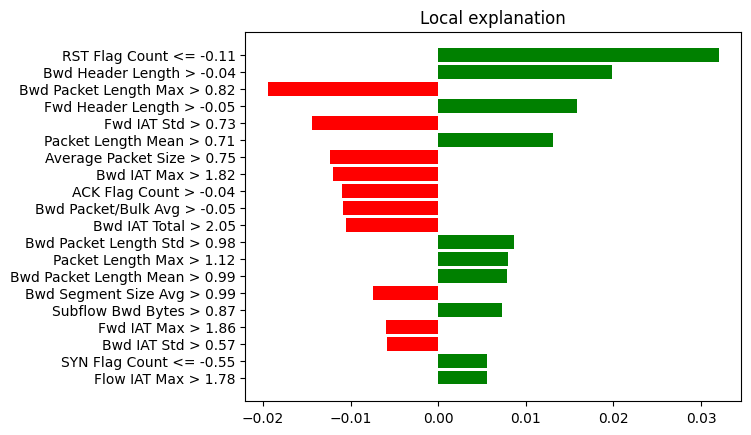

In [ ]:
%matplotlib inline
# Positive and Negative top 20 feature importance score plotted
fig = exp_lime.as_pyplot_figure(label=1)

In [ ]:
# Empirical Values of feature importance/ Contribution
pd.DataFrame(exp_lime.as_list(),columns=['Feature','Contribution'])

,Feature,Contribution
0,RST Flag Count <= -0.11,0.032013
1,Bwd Header Length > -0.04,0.019775
2,Bwd Packet Length Max > 0.82,-0.019429
3,Fwd Header Length > -0.05,0.015867
4,Fwd IAT Std > 0.73,-0.014382
5,Packet Length Mean > 0.71,0.013104
6,Average Packet Size > 0.75,-0.012365
7,Bwd IAT Max > 1.82,-0.012005
8,ACK Flag Count > -0.04,-0.010935
9,Bwd Packet/Bulk Avg > -0.05,-0.010850


# Feature Importance Validation: CNN

In [ ]:
feat_imp_cnn=pd.DataFrame(exp_lime.as_list(),columns=['Feature','Contribution'])

In [ ]:
import re
# These are simple opereations done to extract the important feature names

element_cnn=list(feat_imp_cnn.iloc[:,0])
# List of elements
#elements = ['apple', '123', 'banana!', 'cherry$']

# Regular expression to match alphabets only
pattern = re.compile('[^a-zA-Z]')

# Filter out elements with non-alphabetic characters
filtered_elements_cnn = [pattern.sub('', element) for element in element_cnn]

print(filtered_elements_cnn)  # Output: ['apple', '', 'banana', 'cherry']

['RSTFlagCount', 'BwdHeaderLength', 'BwdPacketLengthMax', 'FwdHeaderLength', 'FwdIATStd', 'PacketLengthMean', 'AveragePacketSize', 'BwdIATMax', 'ACKFlagCount', 'BwdPacketBulkAvg', 'BwdIATTotal', 'BwdPacketLengthStd', 'PacketLengthMax', 'BwdPacketLengthMean', 'BwdSegmentSizeAvg', 'SubflowBwdBytes', 'FwdIATMax', 'BwdIATStd', 'SYNFlagCount', 'FlowIATMax']


In [ ]:
df = pd.DataFrame(X, columns=features)
'''X_ft_cnn=df[['Fwd Act Data Pkts', 'Bwd IAT Std', 'ACK Flag Count', 'Bwd IAT Max', 'Bwd IAT Min', 'Bwd Bulk Rate Avg',
             'Bwd Packet/Bulk Avg', 'PSH Flag Count', 'Fwd Packet Length Mean', 'Bwd Header Length', 'Fwd Seg Size Min',
             'Subflow Bwd Bytes', 'Idle Mean', 'Bwd IAT Total', 'Total Length of Bwd Packet',
             'SYN Flag Count', 'Fwd Segment Size Avg', 'Packet Length Mean', 'Bwd Packet Length Std', 'Total Bwd packets']]'''
X_ft_cnn=df[['RST Flag Count', 'Bwd Header Length', 'Bwd Packet Length Max', 'Fwd Header Length', 'Packet Length Mean', 'Fwd IAT Std', 'Bwd IAT Max', 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'ACK Flag Count', 'Bwd IAT Total', 'Bwd Packet Length Std', 'Packet Length Max', 'Subflow Bwd Bytes', 'Bwd Packet Length Mean', 'Bwd Segment Size Avg', 'Fwd IAT Max', 'Flow IAT Max', 'Packet Length Std', 'SYN Flag Count']]

In [ ]:
'''X_cnn_list=['Fwd Act Data Pkts', 'Bwd IAT Std', 'ACK Flag Count', 'Bwd IAT Max', 'Bwd IAT Min', 'Bwd Bulk Rate Avg',
             'Bwd Packet/Bulk Avg', 'PSH Flag Count', 'Fwd Packet Length Mean', 'Bwd Header Length', 'Fwd Seg Size Min',
             'Subflow Bwd Bytes', 'Idle Mean', 'Bwd IAT Total', 'Total Length of Bwd Packet',
             'SYN Flag Count', 'Fwd Segment Size Avg', 'Packet Length Mean', 'Bwd Packet Length Std', 'Total Bwd packets' ]'''
X_cnn_list=['RST Flag Count', 'Bwd Header Length', 'Bwd Packet Length Max', 'Fwd Header Length', 'Packet Length Mean', 'Fwd IAT Std', 'Bwd IAT Max', 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'ACK Flag Count', 'Bwd IAT Total', 'Bwd Packet Length Std', 'Packet Length Max', 'Subflow Bwd Bytes', 'Bwd Packet Length Mean', 'Bwd Segment Size Avg', 'Fwd IAT Max', 'Flow IAT Max', 'Packet Length Std', 'SYN Flag Count']

## Train test split for CNN-LIME

In [ ]:
from sklearn.model_selection import train_test_split

X_tr_cnn, X_te_cnn, y_tr_cnn, y_te_cnn = train_test_split( X_ft_cnn, onehotlabels, train_size=0.90, random_state=50)

## Random forest to Validate feature importance

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_cnn = RandomForestClassifier()
rf_cnn.fit(X_tr_cnn, y_tr_cnn)

y_pred_rf_cnn = rf_cnn.predict(X_te_cnn)

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
print(classification_report(y_te_cnn, y_pred_rf_cnn))
print(accuracy_score(y_te_cnn, y_pred_rf_cnn))

precision_number_C.append(0.95)
accuracy_number_C.append(0.97)
recall_number_C.append(0.90)
f1score_number_C.append(0.93)

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      9315
           1       0.92      0.91      0.91      2318
           2       0.94      0.80      0.87       150
           3       0.95      0.91      0.93      2366

   micro avg       0.97      0.97      0.97     14149
   macro avg       0.95      0.90      0.93     14149
weighted avg       0.97      0.97      0.97     14149
 samples avg       0.97      0.97      0.97     14149

0.9657219591490565


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# LSTM Model and Testing

In [ ]:
lstm = keras.models.load_model('/content/drive/My Drive/model_lstm.h5')

In [ ]:
_, accuracy = lstm.evaluate(X_test, y_test, batch_size=32, verbose=1)

443/443 [==============================] - 14s 29ms/step - loss: 1.3775 - accuracy: 0.4670


In [ ]:
precision_number_L = []
accuracy_number_L = []
recall_number_L = []
f1score_number_L = []

## **Top 1 features**

In [ ]:
# Index corresponding to the test vector
i = 10

# Number denoting the top features
k = 1

# Calling the explain_instance method by passing in the:
#    1) ith test vector
#    2) prediction function used by our prediction model('reg' in this case)
#    3) the top features which we want to see, denoted by k

exp_lime1 = explainer_lime.explain_instance( xm[i], lstm.predict, num_features=k)

# Finally visualizing the explanations
exp_lime1.show_in_notebook()

157/157 [==============================] - 5s 29ms/step
Intercept 0.24817775611048806
Prediction_local [0.24346764]
Right: 0.23868756


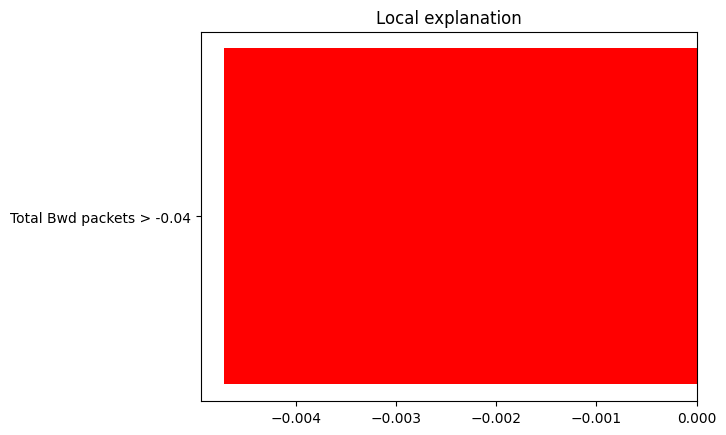

In [ ]:
%matplotlib inline
# Positive and Negative top 20 feature importance score plotted
fig1 = exp_lime1.as_pyplot_figure(label=1)

In [ ]:
# Empirical Values of feature importance/ Contribution
pd.DataFrame(exp_lime1.as_list(),columns=['Feature','Contribution'])

,Feature,Contribution
0,Total Bwd packets > -0.04,-0.00471


In [ ]:
feat_imp_lstm=pd.DataFrame(exp_lime1.as_list(),columns=['Feature','Contribution'])

In [ ]:
import re

elements=list(feat_imp_lstm.iloc[:,0])
# List of elements
#elements = ['apple', '123', 'banana!', 'cherry$']

# Regular expression to match alphabets only
pattern = re.compile('[^a-zA-Z]')

# Filter out elements with non-alphabetic characters
filtered_elements = [pattern.sub('', element) for element in elements]

print(filtered_elements)  # Output: ['apple', '', 'banana', 'cherry']


['TotalBwdpackets']


In [ ]:
df = pd.DataFrame(X, columns=features)
'''X_ft_lstm=df[['Bwd Segment Size Avg', 'Fwd Act Data Pkts', 'FWD Init Win Bytes', 'Subflow Bwd Bytes', 'Bwd Init Win Bytes',
 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'Packet Length Variance', 'Idle Min', 'Fwd Seg Size Min', 'Subflow Fwd Bytes',
 'Fwd Segment Size Avg', 'PSH Flag Count', 'Bwd IAT Min', 'Idle Mean', 'Bwd Packet Length Mean', 'Packet Length Mean',
 'Fwd Packets/s', 'Flow Bytes/s', 'Bwd Packet Length Std']]'''

X_ft_lstm=df[['Total Bwd packets']]

In [ ]:
'''X_lstm_list=['Bwd Segment Size Avg', 'Fwd Act Data Pkts', 'FWD Init Win Bytes', 'Subflow Bwd Bytes', 'Bwd Init Win Bytes',
 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'Packet Length Variance', 'Idle Min', 'Fwd Seg Size Min', 'Subflow Fwd Bytes',
 'Fwd Segment Size Avg', 'PSH Flag Count', 'Bwd IAT Min', 'Idle Mean', 'Bwd Packet Length Mean', 'Packet Length Mean',
 'Fwd Packets/s', 'Flow Bytes/s', 'Bwd Packet Length Std']'''

X_lstm_list=['Total Bwd packets']

In [ ]:
from sklearn.model_selection import train_test_split
X_tr_lstm, X_te_lstm, y_tr_lstm, y_te_lstm = train_test_split( X_ft_lstm, onehotlabels, train_size=0.90, random_state=50)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X_tr_lstm, y_tr_lstm)

y_pred_rf = rf.predict(X_te_lstm)

In [ ]:
# Metrics to compare the performance
from sklearn.metrics import classification_report
print(classification_report(y_te_lstm, y_pred_rf))
print(accuracy_score(y_te_lstm, y_pred_rf))

precision_number_L.append(0.64)
accuracy_number_L.append(0.51)
recall_number_L.append(0.29)
f1score_number_L.append(0.33)

              precision    recall  f1-score   support

           0       0.75      0.77      0.76      9315
           1       0.46      0.01      0.02      2318
           2       0.71      0.37      0.48       150
           3       0.65      0.02      0.03      2366

   micro avg       0.75      0.51      0.61     14149
   macro avg       0.64      0.29      0.32     14149
weighted avg       0.69      0.51      0.51     14149
 samples avg       0.51      0.51      0.51     14149

0.5143826418828186


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## **Top 2 features**

In [ ]:
# Index corresponding to the test vector
i = 10

# Number denoting the top features
k = 2

# Calling the explain_instance method by passing in the:
#    1) ith test vector
#    2) prediction function used by our prediction model('reg' in this case)
#    3) the top features which we want to see, denoted by k

exp_lime1 = explainer_lime.explain_instance( xm[i], lstm.predict, num_features=k)

# Finally visualizing the explanations
exp_lime1.show_in_notebook()

157/157 [==============================] - 4s 28ms/step
Intercept 0.24855619293836145
Prediction_local [0.23929867]
Right: 0.23868756


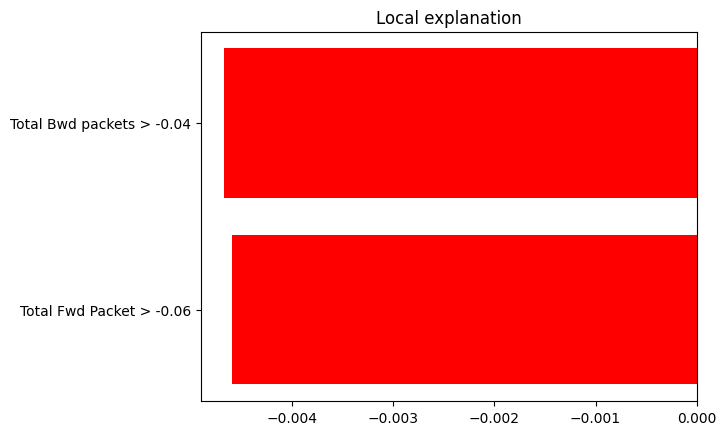

In [ ]:
%matplotlib inline
# Positive and Negative top 20 feature importance score plotted
fig1 = exp_lime1.as_pyplot_figure(label=1)

In [ ]:
# Empirical Values of feature importance/ Contribution
pd.DataFrame(exp_lime1.as_list(),columns=['Feature','Contribution'])

,Feature,Contribution
0,Total Bwd packets > -0.04,-0.004668
1,Total Fwd Packet > -0.06,-0.004590


In [ ]:
feat_imp_lstm=pd.DataFrame(exp_lime1.as_list(),columns=['Feature','Contribution'])

In [ ]:
import re

elements=list(feat_imp_lstm.iloc[:,0])
# List of elements
#elements = ['apple', '123', 'banana!', 'cherry$']

# Regular expression to match alphabets only
pattern = re.compile('[^a-zA-Z]')

# Filter out elements with non-alphabetic characters
filtered_elements = [pattern.sub('', element) for element in elements]

print(filtered_elements)  # Output: ['apple', '', 'banana', 'cherry']


['TotalBwdpackets', 'TotalFwdPacket']


In [ ]:
df = pd.DataFrame(X, columns=features)
'''X_ft_lstm=df[['Bwd Segment Size Avg', 'Fwd Act Data Pkts', 'FWD Init Win Bytes', 'Subflow Bwd Bytes', 'Bwd Init Win Bytes',
 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'Packet Length Variance', 'Idle Min', 'Fwd Seg Size Min', 'Subflow Fwd Bytes',
 'Fwd Segment Size Avg', 'PSH Flag Count', 'Bwd IAT Min', 'Idle Mean', 'Bwd Packet Length Mean', 'Packet Length Mean',
 'Fwd Packets/s', 'Flow Bytes/s', 'Bwd Packet Length Std']]'''

X_ft_lstm=df[['Total Bwd packets', 'Total Fwd Packet']]

In [ ]:
'''X_lstm_list=['Bwd Segment Size Avg', 'Fwd Act Data Pkts', 'FWD Init Win Bytes', 'Subflow Bwd Bytes', 'Bwd Init Win Bytes',
 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'Packet Length Variance', 'Idle Min', 'Fwd Seg Size Min', 'Subflow Fwd Bytes',
 'Fwd Segment Size Avg', 'PSH Flag Count', 'Bwd IAT Min', 'Idle Mean', 'Bwd Packet Length Mean', 'Packet Length Mean',
 'Fwd Packets/s', 'Flow Bytes/s', 'Bwd Packet Length Std']'''

X_lstm_list=['Total Bwd packets', 'Total Fwd Packet']

In [ ]:
from sklearn.model_selection import train_test_split
X_tr_lstm, X_te_lstm, y_tr_lstm, y_te_lstm = train_test_split( X_ft_lstm, onehotlabels, train_size=0.90, random_state=50)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X_tr_lstm, y_tr_lstm)

y_pred_rf = rf.predict(X_te_lstm)

In [ ]:
# Metrics to compare the performance
from sklearn.metrics import classification_report
print(classification_report(y_te_lstm, y_pred_rf))
print(accuracy_score(y_te_lstm, y_pred_rf))

precision_number_L.append(0.77)
accuracy_number_L.append(0.56)
recall_number_L.append(0.36)
f1score_number_L.append(0.41)

              precision    recall  f1-score   support

           0       0.78      0.81      0.79      9315
           1       0.75      0.08      0.15      2318
           2       0.86      0.48      0.62       150
           3       0.71      0.05      0.09      2366

   micro avg       0.78      0.56      0.65     14149
   macro avg       0.78      0.35      0.41     14149
weighted avg       0.77      0.56      0.57     14149
 samples avg       0.56      0.56      0.56     14149

0.5571418474803873


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## **Top 3 features**

In [ ]:
# Index corresponding to the test vector
i = 10

# Number denoting the top features
k = 3

# Calling the explain_instance method by passing in the:
#    1) ith test vector
#    2) prediction function used by our prediction model('reg' in this case)
#    3) the top features which we want to see, denoted by k

exp_lime1 = explainer_lime.explain_instance( xm[i], lstm.predict, num_features=k)

# Finally visualizing the explanations
exp_lime1.show_in_notebook()

157/157 [==============================] - 7s 44ms/step
Intercept 0.24900118644074254
Prediction_local [0.23634348]
Right: 0.23868756


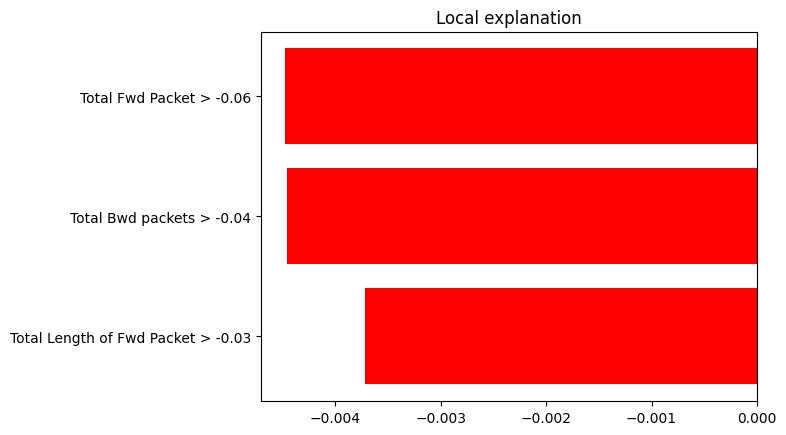

In [ ]:
%matplotlib inline
# Positive and Negative top 20 feature importance score plotted
fig1 = exp_lime1.as_pyplot_figure(label=1)

In [ ]:
# Empirical Values of feature importance/ Contribution
pd.DataFrame(exp_lime1.as_list(),columns=['Feature','Contribution'])

,Feature,Contribution
0,Total Fwd Packet > -0.06,-0.004479
1,Total Bwd packets > -0.04,-0.004460
2,Total Length of Fwd Packet > -0.03,-0.003718


In [ ]:
feat_imp_lstm=pd.DataFrame(exp_lime1.as_list(),columns=['Feature','Contribution'])

In [ ]:
import re

elements=list(feat_imp_lstm.iloc[:,0])
# List of elements
#elements = ['apple', '123', 'banana!', 'cherry$']

# Regular expression to match alphabets only
pattern = re.compile('[^a-zA-Z]')

# Filter out elements with non-alphabetic characters
filtered_elements = [pattern.sub('', element) for element in elements]

print(filtered_elements)  # Output: ['apple', '', 'banana', 'cherry']


['TotalFwdPacket', 'TotalBwdpackets', 'TotalLengthofFwdPacket']


In [ ]:
df = pd.DataFrame(X, columns=features)
'''X_ft_lstm=df[['Bwd Segment Size Avg', 'Fwd Act Data Pkts', 'FWD Init Win Bytes', 'Subflow Bwd Bytes', 'Bwd Init Win Bytes',
 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'Packet Length Variance', 'Idle Min', 'Fwd Seg Size Min', 'Subflow Fwd Bytes',
 'Fwd Segment Size Avg', 'PSH Flag Count', 'Bwd IAT Min', 'Idle Mean', 'Bwd Packet Length Mean', 'Packet Length Mean',
 'Fwd Packets/s', 'Flow Bytes/s', 'Bwd Packet Length Std']]'''

X_ft_lstm=df[['Total Bwd packets', 'Total Fwd Packet', 'Total Length of Fwd Packet']]

In [ ]:
'''X_lstm_list=['Bwd Segment Size Avg', 'Fwd Act Data Pkts', 'FWD Init Win Bytes', 'Subflow Bwd Bytes', 'Bwd Init Win Bytes',
 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'Packet Length Variance', 'Idle Min', 'Fwd Seg Size Min', 'Subflow Fwd Bytes',
 'Fwd Segment Size Avg', 'PSH Flag Count', 'Bwd IAT Min', 'Idle Mean', 'Bwd Packet Length Mean', 'Packet Length Mean',
 'Fwd Packets/s', 'Flow Bytes/s', 'Bwd Packet Length Std']'''

X_lstm_list=['Total Bwd packets', 'Total Fwd Packet', 'Total Length of Fwd Packet']

In [ ]:
from sklearn.model_selection import train_test_split
X_tr_lstm, X_te_lstm, y_tr_lstm, y_te_lstm = train_test_split( X_ft_lstm, onehotlabels, train_size=0.90, random_state=50)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X_tr_lstm, y_tr_lstm)

y_pred_rf = rf.predict(X_te_lstm)

In [ ]:
# Metrics to compare the performance
from sklearn.metrics import classification_report
print(classification_report(y_te_lstm, y_pred_rf))
print(accuracy_score(y_te_lstm, y_pred_rf))

precision_number_L.append(0.86)
accuracy_number_L.append(0.85)
recall_number_L.append(0.73)
f1score_number_L.append(0.79)

              precision    recall  f1-score   support

           0       0.92      0.94      0.93      9315
           1       0.89      0.61      0.72      2318
           2       0.90      0.67      0.77       150
           3       0.74      0.71      0.73      2366

   micro avg       0.89      0.85      0.87     14149
   macro avg       0.86      0.73      0.79     14149
weighted avg       0.89      0.85      0.86     14149
 samples avg       0.85      0.85      0.85     14149

0.8462788889674182


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## **Top 10 features**

In [ ]:
# Index corresponding to the test vector
i = 10

# Number denoting the top features
k = 10

# Calling the explain_instance method by passing in the:
#    1) ith test vector
#    2) prediction function used by our prediction model('reg' in this case)
#    3) the top features which we want to see, denoted by k

exp_lime1 = explainer_lime.explain_instance( xm[i], lstm.predict, num_features=k)

# Finally visualizing the explanations
exp_lime1.show_in_notebook()

157/157 [==============================] - 4s 25ms/step
Intercept 0.2541465888428112
Prediction_local [0.22506652]
Right: 0.23868756


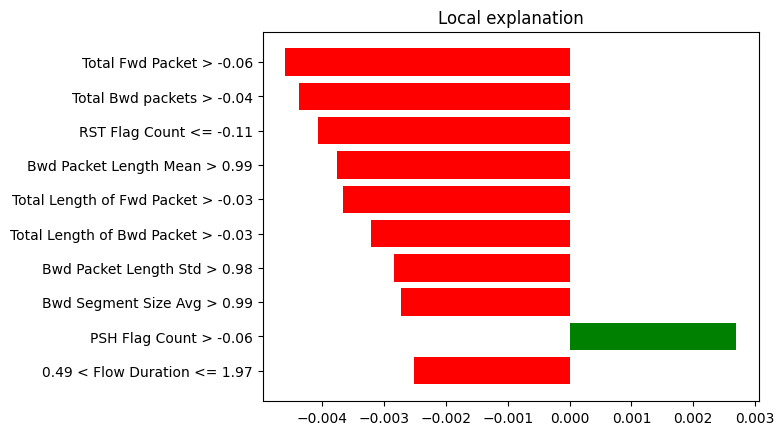

In [ ]:
%matplotlib inline
# Positive and Negative top 20 feature importance score plotted
fig1 = exp_lime1.as_pyplot_figure(label=1)

In [ ]:
# Empirical Values of feature importance/ Contribution
pd.DataFrame(exp_lime1.as_list(),columns=['Feature','Contribution'])

,Feature,Contribution
0,Total Fwd Packet > -0.06,-0.004602
1,Total Bwd packets > -0.04,-0.004381
2,RST Flag Count <= -0.11,-0.004065
3,Bwd Packet Length Mean > 0.99,-0.003755
4,Total Length of Fwd Packet > -0.03,-0.003670
5,Total Length of Bwd Packet > -0.03,-0.003220
6,Bwd Packet Length Std > 0.98,-0.002839
7,Bwd Segment Size Avg > 0.99,-0.002721
8,PSH Flag Count > -0.06,0.002693
9,0.49 < Flow Duration <= 1.97,-0.002520


In [ ]:
feat_imp_lstm=pd.DataFrame(exp_lime1.as_list(),columns=['Feature','Contribution'])

In [ ]:
import re

elements=list(feat_imp_lstm.iloc[:,0])
# List of elements
#elements = ['apple', '123', 'banana!', 'cherry$']

# Regular expression to match alphabets only
pattern = re.compile('[^a-zA-Z]')

# Filter out elements with non-alphabetic characters
filtered_elements = [pattern.sub('', element) for element in elements]

print(filtered_elements)  # Output: ['apple', '', 'banana', 'cherry']


['TotalFwdPacket', 'TotalBwdpackets', 'RSTFlagCount', 'BwdPacketLengthMean', 'TotalLengthofFwdPacket', 'TotalLengthofBwdPacket', 'BwdPacketLengthStd', 'BwdSegmentSizeAvg', 'PSHFlagCount', 'FlowDuration']


In [ ]:
df = pd.DataFrame(X, columns=features)
'''X_ft_lstm=df[['Bwd Segment Size Avg', 'Fwd Act Data Pkts', 'FWD Init Win Bytes', 'Subflow Bwd Bytes', 'Bwd Init Win Bytes',
 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'Packet Length Variance', 'Idle Min', 'Fwd Seg Size Min', 'Subflow Fwd Bytes',
 'Fwd Segment Size Avg', 'PSH Flag Count', 'Bwd IAT Min', 'Idle Mean', 'Bwd Packet Length Mean', 'Packet Length Mean',
 'Fwd Packets/s', 'Flow Bytes/s', 'Bwd Packet Length Std']]'''

X_ft_lstm=df[['Total Bwd packets', 'Total Fwd Packet', 'Total Length of Fwd Packet', 'Bwd Packet Length Mean', 'RST Flag Count', 'Total Length of Bwd Packet', 'Fwd IAT Std', 'Bwd Segment Size Avg', 'PSH Flag Count', 'Fwd PSH Flags']]

In [ ]:
'''X_lstm_list=['Bwd Segment Size Avg', 'Fwd Act Data Pkts', 'FWD Init Win Bytes', 'Subflow Bwd Bytes', 'Bwd Init Win Bytes',
 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'Packet Length Variance', 'Idle Min', 'Fwd Seg Size Min', 'Subflow Fwd Bytes',
 'Fwd Segment Size Avg', 'PSH Flag Count', 'Bwd IAT Min', 'Idle Mean', 'Bwd Packet Length Mean', 'Packet Length Mean',
 'Fwd Packets/s', 'Flow Bytes/s', 'Bwd Packet Length Std']'''

X_lstm_list=['Total Bwd packets', 'Total Fwd Packet', 'Total Length of Fwd Packet', 'Bwd Packet Length Mean', 'RST Flag Count', 'Total Length of Bwd Packet', 'Fwd IAT Std', 'Bwd Segment Size Avg', 'PSH Flag Count', 'Fwd PSH Flags']

In [ ]:
from sklearn.model_selection import train_test_split
X_tr_lstm, X_te_lstm, y_tr_lstm, y_te_lstm = train_test_split( X_ft_lstm, onehotlabels, train_size=0.90, random_state=50)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X_tr_lstm, y_tr_lstm)

y_pred_rf = rf.predict(X_te_lstm)

In [ ]:
# Metrics to compare the performance
from sklearn.metrics import classification_report
print(classification_report(y_te_lstm, y_pred_rf))
print(accuracy_score(y_te_lstm, y_pred_rf))

precision_number_L.append(0.90)
accuracy_number_L.append(0.91)
recall_number_L.append(0.81)
f1score_number_L.append(0.85)

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      9315
           1       0.86      0.74      0.80      2318
           2       0.94      0.72      0.82       150
           3       0.85      0.80      0.82      2366

   micro avg       0.92      0.92      0.92     14149
   macro avg       0.90      0.81      0.85     14149
weighted avg       0.92      0.92      0.92     14149
 samples avg       0.92      0.92      0.92     14149

0.9150469997879709


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## **Top 25 features**

In [ ]:
# Index corresponding to the test vector
i = 10

# Number denoting the top features
k = 25

# Calling the explain_instance method by passing in the:
#    1) ith test vector
#    2) prediction function used by our prediction model('reg' in this case)
#    3) the top features which we want to see, denoted by k

exp_lime1 = explainer_lime.explain_instance( xm[i], lstm.predict, num_features=k)

# Finally visualizing the explanations
exp_lime1.show_in_notebook()

157/157 [==============================] - 4s 27ms/step
Intercept 0.2534188495046936
Prediction_local [0.22980988]
Right: 0.23868756


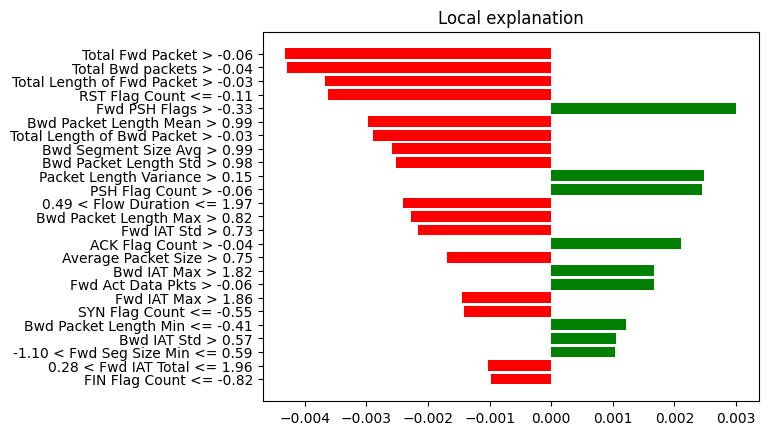

In [ ]:
%matplotlib inline
# Positive and Negative top 20 feature importance score plotted
fig1 = exp_lime1.as_pyplot_figure(label=1)

In [ ]:
# Empirical Values of feature importance/ Contribution
pd.DataFrame(exp_lime1.as_list(),columns=['Feature','Contribution'])

,Feature,Contribution
0,Total Fwd Packet > -0.06,-0.004321
1,Total Bwd packets > -0.04,-0.004292
2,Total Length of Fwd Packet > -0.03,-0.003681
3,RST Flag Count <= -0.11,-0.003628
4,Fwd PSH Flags > -0.33,0.003002
5,Bwd Packet Length Mean > 0.99,-0.002970
6,Total Length of Bwd Packet > -0.03,-0.002897
7,Bwd Segment Size Avg > 0.99,-0.002583
8,Bwd Packet Length Std > 0.98,-0.002517
9,Packet Length Variance > 0.15,0.002483


In [ ]:
feat_imp_lstm=pd.DataFrame(exp_lime1.as_list(),columns=['Feature','Contribution'])

In [ ]:
import re

elements=list(feat_imp_lstm.iloc[:,0])
# List of elements
#elements = ['apple', '123', 'banana!', 'cherry$']

# Regular expression to match alphabets only
pattern = re.compile('[^a-zA-Z]')

# Filter out elements with non-alphabetic characters
filtered_elements = [pattern.sub('', element) for element in elements]

print(filtered_elements)  # Output: ['apple', '', 'banana', 'cherry']


['TotalFwdPacket', 'TotalBwdpackets', 'TotalLengthofFwdPacket', 'RSTFlagCount', 'FwdPSHFlags', 'BwdPacketLengthMean', 'TotalLengthofBwdPacket', 'BwdSegmentSizeAvg', 'BwdPacketLengthStd', 'PacketLengthVariance', 'PSHFlagCount', 'FlowDuration', 'BwdPacketLengthMax', 'FwdIATStd', 'ACKFlagCount', 'AveragePacketSize', 'BwdIATMax', 'FwdActDataPkts', 'FwdIATMax', 'SYNFlagCount', 'BwdPacketLengthMin', 'BwdIATStd', 'FwdSegSizeMin', 'FwdIATTotal', 'FINFlagCount']


In [ ]:
df = pd.DataFrame(X, columns=features)
'''X_ft_lstm=df[['Bwd Segment Size Avg', 'Fwd Act Data Pkts', 'FWD Init Win Bytes', 'Subflow Bwd Bytes', 'Bwd Init Win Bytes',
 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'Packet Length Variance', 'Idle Min', 'Fwd Seg Size Min', 'Subflow Fwd Bytes',
 'Fwd Segment Size Avg', 'PSH Flag Count', 'Bwd IAT Min', 'Idle Mean', 'Bwd Packet Length Mean', 'Packet Length Mean',
 'Fwd Packets/s', 'Flow Bytes/s', 'Bwd Packet Length Std']]'''

X_ft_lstm=df[['Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet', 'RST Flag Count', 'Fwd PSH Flags', 'Bwd Packet Length Mean', 'Total Length of Bwd Packet', 'Bwd Segment Size Avg', 'Bwd Packet Length Std', 'Packet Length Variance', 'PSH Flag Count', 'Flow Duration', 'Bwd Packet Length Max', 'Fwd IAT Std', 'ACK Flag Count', 'Average Packet Size', 'Bwd IAT Max', 'Fwd Act Data Pkts', 'Fwd IAT Max', 'SYN Flag Count', 'Bwd Packet Length Min', 'Bwd IAT Std', 'Fwd Seg Size Min', 'Fwd IAT Total', 'FIN Flag Count']]

In [ ]:
'''X_lstm_list=['Bwd Segment Size Avg', 'Fwd Act Data Pkts', 'FWD Init Win Bytes', 'Subflow Bwd Bytes', 'Bwd Init Win Bytes',
 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'Packet Length Variance', 'Idle Min', 'Fwd Seg Size Min', 'Subflow Fwd Bytes',
 'Fwd Segment Size Avg', 'PSH Flag Count', 'Bwd IAT Min', 'Idle Mean', 'Bwd Packet Length Mean', 'Packet Length Mean',
 'Fwd Packets/s', 'Flow Bytes/s', 'Bwd Packet Length Std']'''

X_lstm_list=['Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet', 'RST Flag Count', 'Fwd PSH Flags', 'Bwd Packet Length Mean', 'Total Length of Bwd Packet', 'Bwd Segment Size Avg', 'Bwd Packet Length Std', 'Packet Length Variance', 'PSH Flag Count', 'Flow Duration', 'Bwd Packet Length Max', 'Fwd IAT Std', 'ACK Flag Count', 'Average Packet Size', 'Bwd IAT Max', 'Fwd Act Data Pkts', 'Fwd IAT Max', 'SYN Flag Count', 'Bwd Packet Length Min', 'Bwd IAT Std', 'Fwd Seg Size Min', 'Fwd IAT Total', 'FIN Flag Count']

In [ ]:
from sklearn.model_selection import train_test_split
X_tr_lstm, X_te_lstm, y_tr_lstm, y_te_lstm = train_test_split( X_ft_lstm, onehotlabels, train_size=0.90, random_state=50)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X_tr_lstm, y_tr_lstm)

y_pred_rf = rf.predict(X_te_lstm)

In [ ]:
# Metrics to compare the performance
from sklearn.metrics import classification_report
print(classification_report(y_te_lstm, y_pred_rf))
print(accuracy_score(y_te_lstm, y_pred_rf))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      9315
           1       0.92      0.92      0.92      2318
           2       0.93      0.81      0.87       150
           3       0.95      0.92      0.93      2366

   micro avg       0.97      0.97      0.97     14149
   macro avg       0.95      0.91      0.93     14149
weighted avg       0.97      0.97      0.97     14149
 samples avg       0.97      0.97      0.97     14149

0.9692557777934836


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## **Top 30 features**

In [ ]:
# Index corresponding to the test vector
i = 10

# Number denoting the top features
k = 30

# Calling the explain_instance method by passing in the:
#    1) ith test vector
#    2) prediction function used by our prediction model('reg' in this case)
#    3) the top features which we want to see, denoted by k

exp_lime1 = explainer_lime.explain_instance( xm[i], lstm.predict, num_features=k)

# Finally visualizing the explanations
exp_lime1.show_in_notebook()

157/157 [==============================] - 4s 24ms/step
Intercept 0.2524359740874837
Prediction_local [0.22949891]
Right: 0.23868756


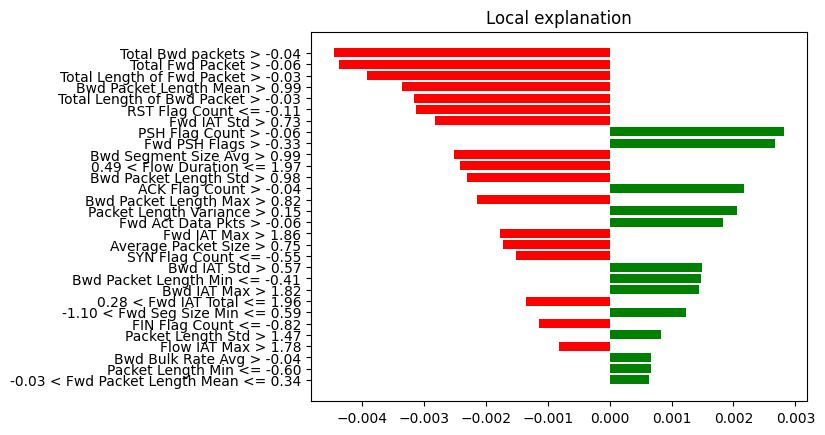

In [ ]:
%matplotlib inline
# Positive and Negative top 20 feature importance score plotted
fig1 = exp_lime1.as_pyplot_figure(label=1)

In [ ]:
# Empirical Values of feature importance/ Contribution
pd.DataFrame(exp_lime1.as_list(),columns=['Feature','Contribution'])

,Feature,Contribution
0,Total Bwd packets > -0.04,-0.004461
1,Total Fwd Packet > -0.06,-0.004376
2,Total Length of Fwd Packet > -0.03,-0.003924
3,Bwd Packet Length Mean > 0.99,-0.003362
4,Total Length of Bwd Packet > -0.03,-0.003162
5,RST Flag Count <= -0.11,-0.003127
6,Fwd IAT Std > 0.73,-0.002827
7,PSH Flag Count > -0.06,0.002824
8,Fwd PSH Flags > -0.33,0.002666
9,Bwd Segment Size Avg > 0.99,-0.002518


In [ ]:
feat_imp_lstm=pd.DataFrame(exp_lime1.as_list(),columns=['Feature','Contribution'])

In [ ]:
import re

elements=list(feat_imp_lstm.iloc[:,0])
# List of elements
#elements = ['apple', '123', 'banana!', 'cherry$']

# Regular expression to match alphabets only
pattern = re.compile('[^a-zA-Z]')

# Filter out elements with non-alphabetic characters
filtered_elements = [pattern.sub('', element) for element in elements]

print(filtered_elements)  # Output: ['apple', '', 'banana', 'cherry']


['TotalBwdpackets', 'TotalFwdPacket', 'TotalLengthofFwdPacket', 'BwdPacketLengthMean', 'TotalLengthofBwdPacket', 'RSTFlagCount', 'FwdIATStd', 'PSHFlagCount', 'FwdPSHFlags', 'BwdSegmentSizeAvg', 'FlowDuration', 'BwdPacketLengthStd', 'ACKFlagCount', 'BwdPacketLengthMax', 'PacketLengthVariance', 'FwdActDataPkts', 'FwdIATMax', 'AveragePacketSize', 'SYNFlagCount', 'BwdIATStd', 'BwdPacketLengthMin', 'BwdIATMax', 'FwdIATTotal', 'FwdSegSizeMin', 'FINFlagCount', 'PacketLengthStd', 'FlowIATMax', 'BwdBulkRateAvg', 'PacketLengthMin', 'FwdPacketLengthMean']


In [ ]:
df = pd.DataFrame(X, columns=features)
'''X_ft_lstm=df[['Bwd Segment Size Avg', 'Fwd Act Data Pkts', 'FWD Init Win Bytes', 'Subflow Bwd Bytes', 'Bwd Init Win Bytes',
 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'Packet Length Variance', 'Idle Min', 'Fwd Seg Size Min', 'Subflow Fwd Bytes',
 'Fwd Segment Size Avg', 'PSH Flag Count', 'Bwd IAT Min', 'Idle Mean', 'Bwd Packet Length Mean', 'Packet Length Mean',
 'Fwd Packets/s', 'Flow Bytes/s', 'Bwd Packet Length Std']]'''

X_ft_lstm=df[['Total Fwd Packet', 'Total Bwd packets', 'RST Flag Count', 'Total Length of Fwd Packet', 'Bwd Packet Length Mean', 'Total Length of Bwd Packet', 'Fwd PSH Flags', 'Fwd IAT Std', 'PSH Flag Count', 'Bwd Packet Length Std', 'Bwd Segment Size Avg', 'Flow Duration', 'Bwd Packet Length Max', 'Packet Length Variance', 'ACK Flag Count', 'Fwd Act Data Pkts', 'SYN Flag Count', 'Bwd Packet Length Min', 'Fwd IAT Total', 'Fwd IAT Max', 'Average Packet Size', 'Bwd IAT Max', 'Bwd IAT Std', 'Fwd Seg Size Min', 'Packet Length Max', 'FIN Flag Count', 'Packet Length Std', 'Flow IAT Max', 'Fwd Header Length', 'Fwd IAT Mean']]

In [ ]:
'''X_lstm_list=['Bwd Segment Size Avg', 'Fwd Act Data Pkts', 'FWD Init Win Bytes', 'Subflow Bwd Bytes', 'Bwd Init Win Bytes',
 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'Packet Length Variance', 'Idle Min', 'Fwd Seg Size Min', 'Subflow Fwd Bytes',
 'Fwd Segment Size Avg', 'PSH Flag Count', 'Bwd IAT Min', 'Idle Mean', 'Bwd Packet Length Mean', 'Packet Length Mean',
 'Fwd Packets/s', 'Flow Bytes/s', 'Bwd Packet Length Std']'''

X_lstm_list=['Total Fwd Packet', 'Total Bwd packets', 'RST Flag Count', 'Total Length of Fwd Packet', 'Bwd Packet Length Mean', 'Total Length of Bwd Packet', 'Fwd PSH Flags', 'Fwd IAT Std', 'PSH Flag Count', 'Bwd Packet Length Std', 'Bwd Segment Size Avg', 'Flow Duration', 'Bwd Packet Length Max', 'Packet Length Variance', 'ACK Flag Count', 'Fwd Act Data Pkts', 'SYN Flag Count', 'Bwd Packet Length Min', 'Fwd IAT Total', 'Fwd IAT Max', 'Average Packet Size', 'Bwd IAT Max', 'Bwd IAT Std', 'Fwd Seg Size Min', 'Packet Length Max', 'FIN Flag Count', 'Packet Length Std', 'Flow IAT Max', 'Fwd Header Length', 'Fwd IAT Mean']

In [ ]:
from sklearn.model_selection import train_test_split
X_tr_lstm, X_te_lstm, y_tr_lstm, y_te_lstm = train_test_split( X_ft_lstm, onehotlabels, train_size=0.90, random_state=50)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X_tr_lstm, y_tr_lstm)

y_pred_rf = rf.predict(X_te_lstm)

In [ ]:
# Metrics to compare the performance
from sklearn.metrics import classification_report
print(classification_report(y_te_lstm, y_pred_rf))
print(accuracy_score(y_te_lstm, y_pred_rf))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      9315
           1       0.92      0.92      0.92      2318
           2       0.93      0.80      0.86       150
           3       0.95      0.92      0.94      2366

   micro avg       0.97      0.97      0.97     14149
   macro avg       0.95      0.91      0.93     14149
weighted avg       0.97      0.97      0.97     14149
 samples avg       0.97      0.97      0.97     14149

0.9693264541663722


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Explanation by LIME: LSTM

In [ ]:
# Index corresponding to the test vector
i = 10

# Number denoting the top features
k = 20

# Calling the explain_instance method by passing in the:
#    1) ith test vector
#    2) prediction function used by our prediction model('reg' in this case)
#    3) the top features which we want to see, denoted by k

exp_lime1 = explainer_lime.explain_instance( xm[i], lstm.predict, num_features=k)

# Finally visualizing the explanations
exp_lime1.show_in_notebook()

157/157 [==============================] - 5s 32ms/step
Intercept 0.25267257922609404
Prediction_local [0.22787377]
Right: 0.23868756


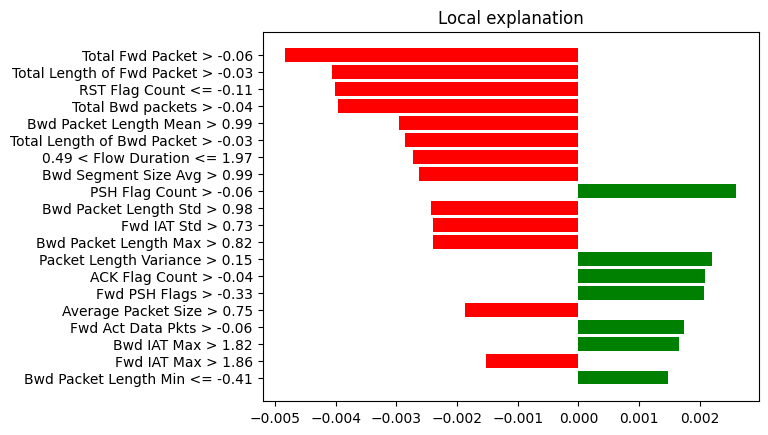

In [ ]:
%matplotlib inline
# Positive and Negative top 20 feature importance score plotted
fig1 = exp_lime1.as_pyplot_figure(label=1)

In [ ]:
# Empirical Values of feature importance/ Contribution
pd.DataFrame(exp_lime1.as_list(),columns=['Feature','Contribution'])

,Feature,Contribution
0,Total Fwd Packet > -0.06,-0.004833
1,Total Length of Fwd Packet > -0.03,-0.004066
2,RST Flag Count <= -0.11,-0.004009
3,Total Bwd packets > -0.04,-0.003969
4,Bwd Packet Length Mean > 0.99,-0.002954
5,Total Length of Bwd Packet > -0.03,-0.002859
6,0.49 < Flow Duration <= 1.97,-0.002723
7,Bwd Segment Size Avg > 0.99,-0.002621
8,PSH Flag Count > -0.06,0.002600
9,Bwd Packet Length Std > 0.98,-0.002422


# Feature Importance Validation: LSTM

In [ ]:
feat_imp_lstm=pd.DataFrame(exp_lime1.as_list(),columns=['Feature','Contribution'])

In [ ]:
import re

elements=list(feat_imp_lstm.iloc[:,0])
# List of elements
#elements = ['apple', '123', 'banana!', 'cherry$']

# Regular expression to match alphabets only
pattern = re.compile('[^a-zA-Z]')

# Filter out elements with non-alphabetic characters
filtered_elements = [pattern.sub('', element) for element in elements]

print(filtered_elements)  # Output: ['apple', '', 'banana', 'cherry']


['TotalFwdPacket', 'TotalLengthofFwdPacket', 'RSTFlagCount', 'TotalBwdpackets', 'BwdPacketLengthMean', 'TotalLengthofBwdPacket', 'FlowDuration', 'BwdSegmentSizeAvg', 'PSHFlagCount', 'BwdPacketLengthStd', 'FwdIATStd', 'BwdPacketLengthMax', 'PacketLengthVariance', 'ACKFlagCount', 'FwdPSHFlags', 'AveragePacketSize', 'FwdActDataPkts', 'BwdIATMax', 'FwdIATMax', 'BwdPacketLengthMin']


In [ ]:
df = pd.DataFrame(X, columns=features)
'''X_ft_lstm=df[['Bwd Segment Size Avg', 'Fwd Act Data Pkts', 'FWD Init Win Bytes', 'Subflow Bwd Bytes', 'Bwd Init Win Bytes',
 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'Packet Length Variance', 'Idle Min', 'Fwd Seg Size Min', 'Subflow Fwd Bytes',
 'Fwd Segment Size Avg', 'PSH Flag Count', 'Bwd IAT Min', 'Idle Mean', 'Bwd Packet Length Mean', 'Packet Length Mean',
 'Fwd Packets/s', 'Flow Bytes/s', 'Bwd Packet Length Std']]'''

X_ft_lstm=df[['Total Bwd packets', 'Total Fwd Packet', 'Total Length of Fwd Packet', 'Bwd Packet Length Mean', 'RST Flag Count', 'Total Length of Bwd Packet', 'Fwd IAT Std', 'Bwd Segment Size Avg', 'PSH Flag Count', 'Fwd PSH Flags', 'Flow Duration', 'Bwd Packet Length Std', 'Packet Length Variance', 'ACK Flag Count', 'Bwd Packet Length Max', 'Average Packet Size', 'Fwd Act Data Pkts', 'SYN Flag Count', 'Fwd IAT Max', 'Bwd IAT Max']]

In [ ]:
'''X_lstm_list=['Bwd Segment Size Avg', 'Fwd Act Data Pkts', 'FWD Init Win Bytes', 'Subflow Bwd Bytes', 'Bwd Init Win Bytes',
 'Bwd Packet/Bulk Avg', 'Average Packet Size', 'Packet Length Variance', 'Idle Min', 'Fwd Seg Size Min', 'Subflow Fwd Bytes',
 'Fwd Segment Size Avg', 'PSH Flag Count', 'Bwd IAT Min', 'Idle Mean', 'Bwd Packet Length Mean', 'Packet Length Mean',
 'Fwd Packets/s', 'Flow Bytes/s', 'Bwd Packet Length Std']'''

X_lstm_list=['Total Bwd packets', 'Total Fwd Packet', 'Total Length of Fwd Packet', 'Bwd Packet Length Mean', 'RST Flag Count', 'Total Length of Bwd Packet', 'Fwd IAT Std', 'Bwd Segment Size Avg', 'PSH Flag Count', 'Fwd PSH Flags', 'Flow Duration', 'Bwd Packet Length Std', 'Packet Length Variance', 'ACK Flag Count', 'Bwd Packet Length Max', 'Average Packet Size', 'Fwd Act Data Pkts', 'SYN Flag Count', 'Fwd IAT Max', 'Bwd IAT Max']

## Train test split for LSTM-LIME

In [ ]:
from sklearn.model_selection import train_test_split
X_tr_lstm, X_te_lstm, y_tr_lstm, y_te_lstm = train_test_split( X_ft_lstm, onehotlabels, train_size=0.90, random_state=50)

## Random Forest to Validate Feature importance

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X_tr_lstm, y_tr_lstm)

y_pred_rf = rf.predict(X_te_lstm)

In [ ]:
# Metrics to compare the performance
from sklearn.metrics import classification_report
print(classification_report(y_te_lstm, y_pred_rf))
print(accuracy_score(y_te_lstm, y_pred_rf))

precision_number_L.append(0.95)
accuracy_number_L.append(0.95)
recall_number_L.append(0.89)
f1score_number_L.append(0.92)

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      9315
           1       0.91      0.90      0.90      2318
           2       0.94      0.78      0.85       150
           3       0.95      0.87      0.91      2366

   micro avg       0.96      0.95      0.96     14149
   macro avg       0.95      0.89      0.91     14149
weighted avg       0.96      0.95      0.96     14149
 samples avg       0.95      0.95      0.95     14149

0.9536362993851155


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Comparing Feature Importance Across Models

In [ ]:
feat_imp_cnn['Contribution']

0     0.028596
1     0.021030
2    -0.019620
3     0.015674
4     0.013804
5    -0.013281
6    -0.012416
7    -0.011759
8    -0.011638
9    -0.010137
10   -0.009908
11   -0.008772
12    0.008757
13    0.008368
14    0.008347
15    0.008337
16    0.007336
17    0.006254
18   -0.005727
19   -0.005405
Name: Contribution, dtype: float64

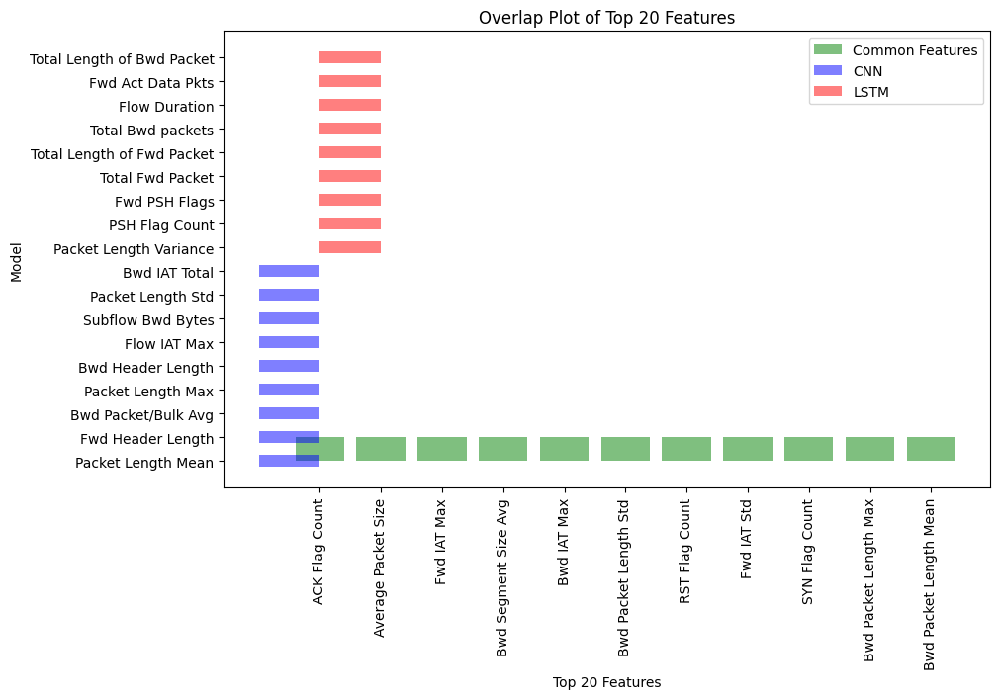

In [ ]:
import matplotlib.pyplot as plt

# define the two lists of top 20 features
#top_20_features_model_1 = ['feature_1', 'feature_2', ..., 'feature_20']
#top_20_features_model_2 = ['feature_1', 'feature_3', ..., 'feature_19']

# create a set of the top 20 features from each model
set_model_1 = set(X_ft_cnn)
set_model_2 = set(X_ft_lstm)

# compute the common top 20 features between the two models
common_features = list(set_model_1.intersection(set_model_2))

# compute the unique top 20 features for each model
unique_features_model_1 = list(set_model_1 - set_model_2)
unique_features_model_2 = list(set_model_2 - set_model_1)

# create the overlap plot
fig, ax = plt.subplots(figsize=(10, 6))

# plot the common features
ax.bar(common_features, height=1, color='green', alpha=0.5, label='Common Features')

# plot the unique features for model 1
ax.barh(unique_features_model_1, width=-1, height=0.5, color='blue', alpha=0.5, label='CNN')

# plot the unique features for model 2
ax.barh(unique_features_model_2, width=1, height=0.5, color='red', alpha=0.5, label='LSTM')

# set the x and y axis labels and title
ax.set_xlabel('Top 20 Features')
ax.set_ylabel('Model')
ax.set_title('Overlap Plot of Top 20 Features')

plt.xticks(rotation=90)

# add a legend
ax.legend()

# show the plot
plt.show()

# Scatter Plot

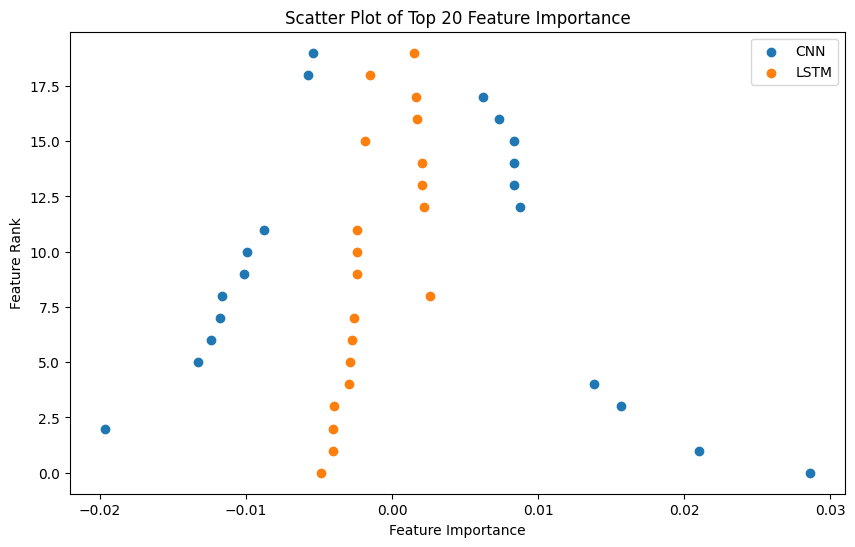

In [ ]:
# define the two lists of top 20 features and their respective importance values
top_20_features_model_1 = X_cnn_list #['feature_1', 'feature_2', ..., 'feature_20']
importance_model_1 = feat_imp_cnn['Contribution'] #[0.8, 0.6, ..., 0.2]
top_20_features_model_2 = X_lstm_list #['feature_1', 'feature_3', ..., 'feature_19']
importance_model_2 = feat_imp_lstm['Contribution'] #[0.7, 0.5, ..., 0.1]

# create a dictionary of feature importance values for each model
importance_dict = {'CNN': importance_model_1, 'LSTM': importance_model_2}

# create the scatter plot
fig, ax = plt.subplots(figsize=(10, 6))

# loop through each model and plot their top 20 features and importance values
for model, importance in importance_dict.items():
    # get the indices of the top 20 features for this model
    indices = [top_20_features_model_1.index(f) if f in top_20_features_model_1 else top_20_features_model_2.index(f) for f in top_20_features_model_1 + top_20_features_model_2][:20]
    # get the importance values for the top 20 features for this model
    values = [importance[i] for i in indices]
    # plot the feature importance values as a scatter plot
    ax.scatter(values, range(20), label=model)

# set the x and y axis labels and title
ax.set_xlabel('Feature Importance')
ax.set_ylabel('Feature Rank')
ax.set_title('Scatter Plot of Top 20 Feature Importance')

# add a legend
ax.legend()

# show the plot
plt.show()

# Bar Plot

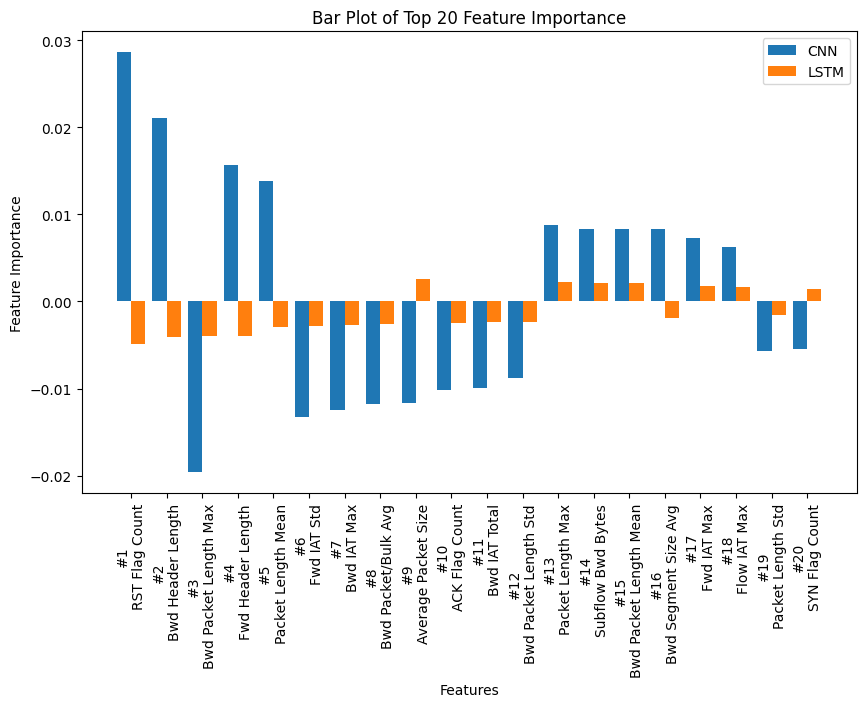

In [ ]:
import numpy as np

# define the two lists of top 20 features and their respective importance values
top_20_features_model_1 = X_cnn_list #['feature_1', 'feature_2', ..., 'feature_20']
importance_model_1 = feat_imp_cnn['Contribution'] #[0.8, 0.6, ..., 0.2]
top_20_features_model_2 = X_lstm_list #['feature_1', 'feature_3', ..., 'feature_19']
importance_model_2 = feat_imp_lstm['Contribution'] #[0.7, 0.5, ..., 0.1]

# create a dictionary of feature importance values for each model
importance_dict = {'CNN': importance_model_1, 'LSTM': importance_model_2}

# set the width of the bars
bar_width = 0.4

# create the bar plot
fig, ax = plt.subplots(figsize=(10, 6))

# loop through each model and plot their top 20 features and importance values
for i, (model, importance) in enumerate(importance_dict.items()):
    # get the indices of the top 20 features for this model
    indices = [top_20_features_model_1.index(f) if f in top_20_features_model_1 else top_20_features_model_2.index(f) for f in top_20_features_model_1 + top_20_features_model_2][:20]
    # get the importance values for the top 20 features for this model
    values = [importance[i] for i in indices]
    # calculate the x-axis positions for the bars
    x_pos = np.arange(len(values)) + i * bar_width
    # plot the feature importance values as a bar plot
    ax.bar(x_pos, values, bar_width, label=model)

# set the x and y axis labels and title
ax.set_xlabel('Features')
ax.set_ylabel('Feature Importance')
ax.set_title('Bar Plot of Top 20 Feature Importance')

# set the x-axis tick positions and labels
xtick_pos = np.arange(20)
xtick_labels = [f'#{i+1}\n{f}' for i, f in enumerate(top_20_features_model_1)]
ax.set_xticks(xtick_pos + bar_width / 2)
ax.set_xticklabels(xtick_labels, rotation='vertical')

# add a legend
ax.legend()

# show the plot
plt.show()


# Box Plot

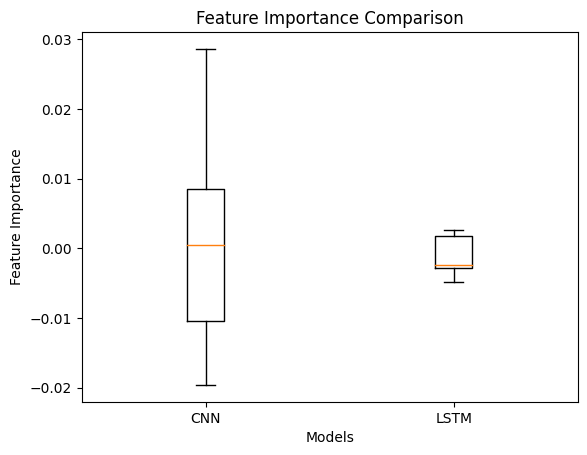

In [ ]:
# sample data for two models
model1 = feat_imp_cnn['Contribution'] # [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
model2 = feat_imp_lstm['Contribution'] # [1, 2, 2, 3, 3, 3, 4, 5, 6, 10]

# create a list of the two models' data
data = [model1, model2]

# set the labels for the x-axis
labels = ['CNN', 'LSTM']

# create the box plot
fig, ax = plt.subplots()
ax.boxplot(data, labels=labels)

# add a title and axis labels
ax.set_title('Feature Importance Comparison')
ax.set_xlabel('Models')
ax.set_ylabel('Feature Importance')

# display the plot
plt.show()


# **Line chart**

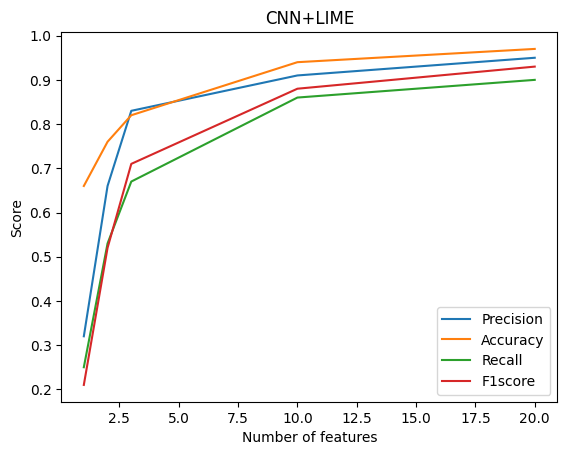

In [ ]:
import matplotlib.pyplot as plt
x= [1,2,3,10,20]

plt.plot(x, precision_number_C, label='Precision')
plt.plot(x, accuracy_number_C, label='Accuracy')
plt.plot(x, recall_number_C, label='Recall')
plt.plot(x, f1score_number_C, label='F1score')

plt.xlabel('Number of features')
plt.ylabel('Score')
plt.title('CNN+LIME')
plt.legend()

plt.show()

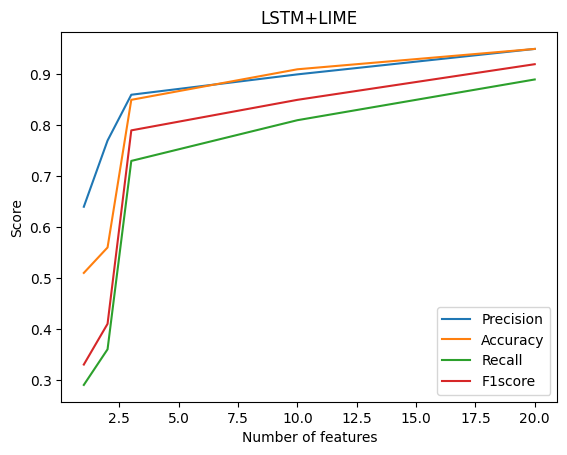

In [ ]:
import matplotlib.pyplot as plt
x= [1,2,3,10,20]

plt.plot(x, precision_number_L, label='Precision')
plt.plot(x, accuracy_number_L, label='Accuracy')
plt.plot(x, recall_number_L, label='Recall')
plt.plot(x, f1score_number_L, label='F1score')

plt.xlabel('Number of features')
plt.ylabel('Score')
plt.title('LSTM+LIME')
plt.legend()

plt.show()